This notebook allows to visualize a TSNE and PCA of the iris dataset

# Load data

In [1]:
from sklearn import datasets
import numpy as np

In [59]:
name = "digit"

In [60]:
if name == "digit":
    dataset = datasets.load_digits()
elif name == "iris":
    dataset = datasets.load_iris()

# Compute transformation

In [61]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression

### Two first dimensions

Select two most interesting dimension by computing maximum values

In [62]:
lr = LogisticRegression().fit(dataset.data, dataset.target)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


In [71]:
original_data = np.hstack((dataset.data[:, np.mean(np.abs(lr.coef_), axis = 0).argsort()[-2:]], dataset.target.reshape(-1, 1)))

### PCA

In [72]:
pca_data = PCA(n_components=2).fit_transform(dataset.data)
pca_data = np.hstack((pca_data, dataset.target.reshape(-1, 1)))

### TSNE

In [73]:
tsne_data = TSNE(n_components=2).fit_transform(dataset.data)
tsne_data = np.hstack((tsne_data, dataset.target.reshape(-1, 1)))

In [74]:
transformations = [original_data, pca_data, tsne_data]

# Animation

In [75]:
from transformationVisualizer import TransformationVisualizer

In [76]:
classes = {i: name for i, name in enumerate(dataset.target_names)}
colors = {i: color for i, color in enumerate(['green', 'blue', 'cyan', 'yellow', 'orange', 'red', 'purple', 'brown', 'olive', 'pink'])}

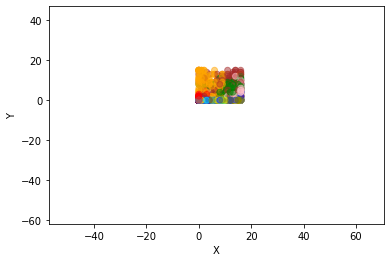

In [77]:
tv = TransformationVisualizer(transformations, classes = classes, colors = colors)

In [78]:
tv.jupyter_visualize()

In [79]:
tv.save_gif('images/{}.gif'.format(name))

----------

# Example without label

In [80]:
import pandas as pd

In [81]:
dataset = pd.read_csv("distances.csv")

In [82]:
pca_data = PCA(n_components=2).fit_transform(dataset)

In [83]:
tsne_data = TSNE(n_components=2).fit_transform(dataset)

In [84]:
transformations = [dataset.values[:,:2], pca_data, tsne_data]

### Visualization

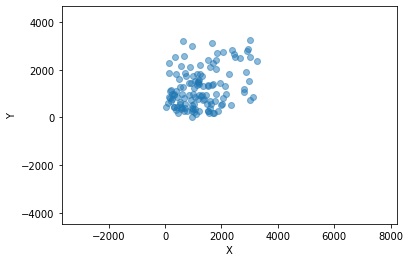

In [55]:
tv = TransformationVisualizer(transformations)

In [57]:
tv.jupyter_visualize()

In [58]:
tv.save_gif('images/distances.gif')